In [25]:
import cv2
import pytesseract
from matplotlib import pyplot as plt
pytesseract.pytesseract.tesseract_cmd = '/opt/homebrew/bin/tesseract'

image = '/Users/rujul/Downloads/IMG_6556-2.jpg'


In [26]:
image_read = cv2.imread(image)
gray = cv2.cvtColor(image_read, cv2.COLOR_BGR2GRAY)
# text = pytesseract.image_to_string(gray)
# text

In [64]:
image_gray = cv2.imwrite("temp/index_gray.png", gray)


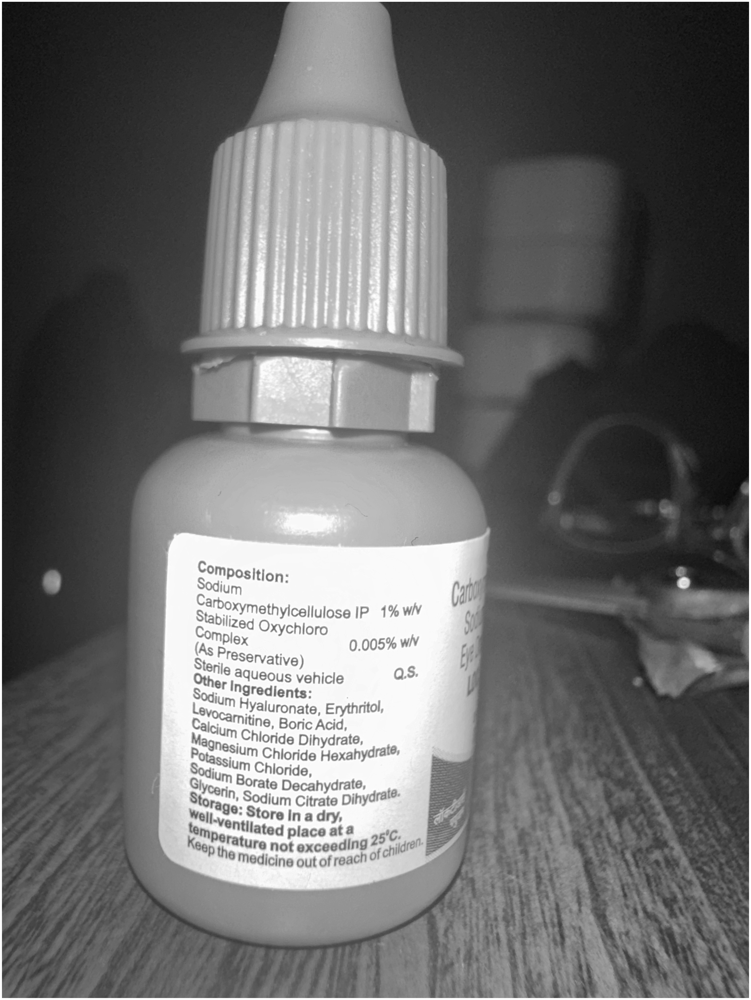

In [31]:
import cv2
import matplotlib.pyplot as plt
import os

def display(im_path):
    dpi = 80
    im_data = plt.imread(im_path)

    height, width = im_data.shape[:2]
    
    # Calculate figure size to fit the image at the specified DPI
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image
    ax.imshow(im_data, cmap='gray')

    plt.show()

# Path to save the image
output_path = "temp/index_gray.png"

# Ensure the directory exists
os.makedirs(os.path.dirname(output_path), exist_ok=True)

# Load the image in grayscale
input_image_path = '/Users/rujul/Downloads/IMG_6556.jpg'  # Replace with your actual image path
gray = cv2.imread(input_image_path, cv2.IMREAD_GRAYSCALE)

# Check if the image was loaded successfully
if gray is None:
    print(f"Error: Failed to load the image. Please check the path: {input_image_path}")
else:
    # Save the image using OpenCV
    success = cv2.imwrite(output_path, gray)

    # Check if the image was saved successfully
    if success:
        # Display the saved image
        display(output_path)
    else:
        print("Error: Failed to save the image. Please check the path and permissions.")


In [13]:
inverted_image = cv2.bitwise_not(gray)
cv2.imwrite("temp/inverted.jpg", inverted_image)

True

In [34]:
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

In [65]:
text = pytesseract.image_to_string(gray)


In [66]:
text

'Composition:\nSodium\n\n§Toxymethyicellulose IP 1% WN\nbiliz\nCompiles: Oxychloro ae\n(As Preservative) -\nOtn® Aqueous vehicle\n° Ingredients: =\nSodium Hyaluronate, Erythritol,\n_amitine, Boric Acid,\nCalcium Chloride Dihydrate, ae\nBh@sium Chloride Hexahyd\n~“SIUM ide,\nex hele hy\n", Sodium Citrate Dihydral@-\nrage: Store In a dry,\nVentilated place at a . 25\'C:, |\nKet eraturg not exceedin of ilare”\nthe medicine out of reach\na a\n'

In [67]:
# import pytesseract
from pytesseract import Output
# import cv2
img = cv2.imread(image)

d = pytesseract.image_to_data(img, output_type=Output.DICT)
n_boxes = len(d['level'])
for i in range(n_boxes):
    (x, y, w, h) = (d['left'][i], d['top'][i], d['width'][i], d['height'][i])
    cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)

cv2.imshow('img', img)
cv2.waitKey(0)

2024-09-01 02:51:18.642 Python[21235:1515472] WARNING: Secure coding is automatically enabled for restorable state! However, not on all supported macOS versions of this application. Opt-in to secure coding explicitly by implementing NSApplicationDelegate.applicationSupportsSecureRestorableState:.


In [7]:
from pytesseract import Output
import numpy as np

img = cv2.imread(image)

d = pytesseract.image_to_data(image, output_type=Output.DICT)
n_boxes = len(d['level'])
boxes = []

# Collect all bounding boxes
for i in range(n_boxes):
    (x, y, w, h) = (d['left'][i], d['top'][i], d['width'][i], d['height'][i])
    boxes.append([x, y, x + w, y + h])

# Convert boxes to a numpy array
boxes = np.array(boxes)

# If there are no boxes, print a message and exit
if len(boxes) == 0:
    print("No bounding boxes found.")
else:
    # Merge overlapping bounding boxes using OpenCV's groupRectangles
    rects, _ = cv2.groupRectangles(boxes.tolist(), groupThreshold=1, eps=0.2)

    # Draw merged bounding boxes
    for (x1, y1, x2, y2) in rects:
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)

    # Display the image with merged bounding boxes
    cv2.imshow('Merged Bounding Boxes', img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

2024-09-01 02:57:20.673 Python[32824:1750005] WARNING: Secure coding is automatically enabled for restorable state! However, not on all supported macOS versions of this application. Opt-in to secure coding explicitly by implementing NSApplicationDelegate.applicationSupportsSecureRestorableState:.


In [53]:
def deskew(cvImage):
    angle = getSkewAngle(cvImage)
    return rotateImage(cvImage, -1.0 * angle)

In [55]:
img = cv2.imread(output_path)
fixed = deskew(img)
cv2.imwrite("temp/rotated_fixed.jpg", fixed)

94


True

In [28]:
image = cv2.imread(image)
base_image = image.copy()
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

In [29]:
blur = cv2.GaussianBlur(gray, (7,7), 0)


In [30]:
thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]


In [31]:
kernal = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 13))
dilate = cv2.dilate(thresh, kernal, iterations=1)
cv2.imwrite("temp/index_dilate.png", dilate)


True

In [32]:
cnts = cv2.findContours(dilate, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

In [33]:
cnts = cnts[0] if len(cnts) == 2 else cents[1]
cnts = sorted(cnts, key=lambda x: cv2.boundingRect(x)[0])


In [35]:
for c in cnts:
    x, y, w, h = cv2.boundingRect(c)
    # if h > 200 and w > 20:
    roi = image[y:y+h, x:x+h]
    cv2.imwrite("temp/index_roi.png", roi)
    cv2.rectangle(image, (x, y), (x+w, y+h), (36, 255, 12), 2)
cv2.imwrite("temp/index_bbox_new.png", image)

True

In [39]:
from apple_ocr.ocr import OCR
from PIL import Image

image = Image.open(image_path)
ocr_instance = OCR(image=image)

In [40]:
dataframe = ocr_instance.recognize()

In [52]:
med_drugs = dataframe.get('Content')

In [53]:
med_drugs

('Composition:',
 'Sodium',
 'Carboxymethylcellulose IP 1% w/v',
 'Stabilized Oxychloro',
 'Complex',
 '0.005% w/V',
 '(As Preservative)',
 'Q.S.',
 'Sterile aqueous vehicle',
 'Other Ingredients:',
 'Sodium Hyaluronate, Erythritol,',
 'Levocarnitine, Boric Acid,',
 'Calcium Chloride Dihydrate,',
 'Magnesium Chloride Hexahydrate,',
 'Potassium Chloride,',
 'Sodium Borate Decahydrate,',
 'Glycerin, Sodium Citrate Dihydrate.',
 'Storage: Store In a dry,',
 'well-ventllated place at a',
 'temperature noplaxceeding 25°C.',
 'Keep the medicine out of reich of chidren.')